In [1]:
import os
import glob
import pickle
import json
import numpy as np
import pandas as pd
from sklearn.preprocessing import MaxAbsScaler
import matplotlib.pyplot as plt
from scipy.spatial import distance
from nilearn.input_data import NiftiLabelsMasker
from nilearn.image import load_img
from nilearn import plotting
from nilearn import datasets

/Users/walters/opt/anaconda3/envs/multitask_env/lib/python3.7/site-packages/nilearn/input_data/__init__.py:27: FutureWarning: The import path 'nilearn.input_data' is deprecated in version 0.9. Importing from 'nilearn.input_data' will be possible at least until release 0.13.0. Please import from 'nilearn.maskers' instead.
  warnings.warn(message, FutureWarning)


In [2]:
## Define params
firstlevel_label = 'first_level_bySession'
analysis_name = 'analysis-3_savedPreds'
num_parcels = 1000
model_name = 'RidgeCV'
parc_label = 'schaefer_2018'
space_label = 'MNI152NLin2009cAsym'


## Define paths
proj_dir = os.path.abspath(os.path.join(os.getcwd(), '../..'))
resources_dir = os.path.join(proj_dir, 'resources')
features_dir = os.path.join(proj_dir, 'X_features')
data_dir = os.path.join(proj_dir, 'Y_data')
parcellations_dir = os.path.join(data_dir, 'parcellation_schemes')
firstlevel_dir = os.path.join(data_dir, firstlevel_label)
output_dir = os.path.join(proj_dir, 'model_outputs', firstlevel_label, analysis_name, model_name)


## Load task2task dict (for more readable naming format), and get task order
with open(os.path.join(resources_dir, 'dicts/task2task.json'), 'rb') as f:
    task2task = json.load(f)
task2task_inv = {v: k for k, v in task2task.items()}


## Load X
X_df = pd.read_csv(os.path.join(features_dir, f'byTask_bySession/X_all.csv'), index_col=0)
metadata_cols = ['task_name', 'task_index', 'session', 'contrast_id']
features = [f for f in X_df.columns.tolist() if f not in metadata_cols]
X = np.array(X_df.filter(features))
X_scaler = MaxAbsScaler()
X_scaled = X_scaler.fit_transform(X)


# Load feature matrix
X_byTask_df = pd.read_csv(os.path.join(features_dir, 'byTask/X_all.csv'), index_col=0)

num_splits = 946

In [3]:
## Load atlas

# atlas
atlas_mni = datasets.fetch_atlas_schaefer_2018(n_rois=1000,
                                               yeo_networks=7,
                                               resolution_mm=1,
                                               data_dir=parcellations_dir)

# atlas in MNI152NLin2009cAsym space
atlas_path = glob.glob(os.path.join(os.path.join(parcellations_dir,
                                                 'schaefer_2018',
                                                 f'*{space_label}*{num_parcels}Parcels*')))[0]
atlas_img = load_img(str(atlas_path))

In [4]:
def load_model_output(output_dir, sub):
    '''
    Input:
        output_dir: directory containing pkl files of subject-specific encoding model results
        sub: subject id (e.g., 'sub-02')
    '''
    
    results_file = glob.glob(os.path.join(output_dir, f'*{sub}*'))[0]
    with open(results_file, 'rb') as f:
        result_dict = pickle.load(f)   

    num_parcels = list(result_dict.keys())[0]
    feature_set = list(result_dict[num_parcels].keys())[0]
    model_name = list(result_dict[num_parcels][feature_set].keys())[0]
    sub = list(result_dict[num_parcels][feature_set][model_name].keys())[0]
    metrics = list(result_dict[num_parcels][feature_set][model_name][sub].keys())
    sub_dict = result_dict[num_parcels][feature_set][model_name][sub]

    cols = ['parcels', 'feature_set', 'model_name', 'sub', 'coefs', 'intercepts', 'preds',
            'testpairs', 'corr_vals', 'test_indices']
    row = [num_parcels, feature_set, model_name, sub,
           sub_dict['coefs'][0],
           sub_dict['intercepts'][0],
           sub_dict['preds'][0],
           sub_dict['testpairs'][0],
           sub_dict['corr_vals'][0],
           sub_dict['test_indices'][0]]

    result_df = pd.DataFrame([row], columns=cols) 

    return result_df



def get_corrs_in_splits(result_df, X_df):
    '''
    Input:
        result_df: Model output df for a single subject
        X_df: feature matrix df with metadata
    '''
    testpairs = result_df['testpairs'][0]
    corr_vals = result_df['corr_vals'][0]
    num_splits = len(testpairs)
    num_tasks = X_df['task_index'].max() + 1
    task_order = [X_df[X_df['task_index']==i].iloc[0]['task_name'] for i in range(num_tasks)]

    rows = []
    for split_idx in range(num_splits):
        split_corrs = [c for test_task in corr_vals[split_idx] for c in test_task]
        pred_idx = 0
        for task_idx, corr in zip(testpairs[split_idx], split_corrs):
            task_name = task_order[task_idx]
            rows.append([split_idx, pred_idx, task_idx, task_name, corr])
            pred_idx += 1
    corr_df = pd.DataFrame(rows, columns=['split_idx', 'pred_idx', 'task_idx', 'task_name', 'corr'])

    return corr_df



def filter_sort_corr_df(corr_df, sort_by_corr=True, num_examples=2,
                        filter_taskName=None, filter_taskID=None, filter_split=None):
    '''
    Note: If sort_by_corr, examples are evenly spaced from low to high out-of-sample map-wise correlations
    '''
    
    examples_df = corr_df.copy()
    if filter_taskName is not None:
        examples_df = examples_df[(examples_df['task_name'].isin(filter_taskName))]
    if filter_taskID is not None:
        examples_df = examples_df[(examples_df['task_idx'].isin(filter_taskID))]
    if filter_split is not None:
        examples_df = examples_df[(examples_df['split_idx'].isin(filter_split))]
    if sort_by_corr:
        corr_sorted_idx = examples_df['corr'].argsort()
        examples_indices = np.linspace(0, examples_df.shape[0] - 1, num_examples).astype(int)
        examples_indices = corr_sorted_idx.values[examples_indices]
        examples_df = examples_df.iloc[examples_indices]
        
    return examples_df



def plot_contrast(img, title='', axes=None, vmin=-3, vmax=3, plot_titles=False):
    if not plot_titles:
        title = ''
    plotting.plot_glass_brain(img, title=title, plot_abs=False, display_mode='lzry', cmap='coolwarm',
                              axes=axes, vmin=vmin, vmax=vmax)
    

    
def plot_examples(output_dir, sub, atlas_img, X_df, task2task_inv,
                  sort_by_corr=True, num_examples=3, vmin_vmax=(-3, 3),
                  filter_taskName=None, filter_taskID=None, filter_split=None,
                  plot_titles=False, plot_original=False):

    # Fetch model results for a single subject
    result_df = load_model_output(output_dir, sub)
    
    # Make df where each row is a one prediction (for one task in one session) during one split
    corr_df = get_corrs_in_splits(result_df, X_df)
    
    # Filter and sort corr_df
    examples_df = filter_sort_corr_df(corr_df, sort_by_corr, num_examples, filter_taskName, filter_taskID, filter_split)

    
    # Plots
    for _, row in examples_df.iterrows():
        
        # Extract metadata
        split_idx = row['split_idx']
        pred_idx = row['pred_idx']
        task_name = row['task_name']
        corr = row['corr']
        task_name_short = task2task_inv[task_name]
        map_idx = result_df['test_indices'][0][split_idx][pred_idx] # index of test map in feature matrix
        session = X_df[X_df['contrast_id']==map_idx]['session'].values[0]
        
        # Retrieve prediction
        PRED = result_df['preds'][0][split_idx][pred_idx]
    
        # Define parcellation
        masker = NiftiLabelsMasker(labels_img=atlas_img, resampling_target='data')
        masker.fit();
        
        # Plot unparcellated ground truth, True, and Prediction
        print('*' * 100); print('*' * 100); print('*' * 100)
        
        title = f'{sub}, split-{split_idx}, {session}, {task_name}'
        print(f'\n{title}')
        print(f'Pearson\'s r = {corr:0.3f}\n')
        
        # Original unparcellated nii
        if plot_original:
            print('*' * 10)
            image_path = f'{firstlevel_dir}/{session}/{sub}/niis/{sub}_{task_name_short}_zmap.nii.gz'
            print(f'\n{image_path}')
            img = load_img(image_path)
            print(f'\n{title} (Ground truth)')
            ax = plot_contrast(img, f'{title} (Ground Truth)', vmin=vmin_vmax[0], vmax=vmin_vmax[1], plot_titles=plot_titles)
            plt.show(); plt.close()

        # True
        print('*' * 10)
        image_path = f'{firstlevel_dir}/{session}/{sub}/parcellated/{parc_label}/{space_label}/{sub}_{task_name_short}_zmap.npy'
        print(f'\n{image_path}')
        TRUE = np.load(image_path)
        img = masker.inverse_transform([TRUE.reshape(-1)])
        print(f'\n{title} (True)')
        ax = plot_contrast(img, f'{title} (True)', vmin=vmin_vmax[0], vmax=vmin_vmax[1], plot_titles=plot_titles)
        plt.show(); plt.close()

        # Prediction
        print('*' * 10)
        img = masker.inverse_transform([PRED])
        print(f'\n{title} (Predicted)')
        ax = plot_contrast(img, f'{title} (Predicted)', vmin=vmin_vmax[0], vmax=vmin_vmax[1], plot_titles=plot_titles)
        plt.show(); plt.close()

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-03, split-693, b2, Word Reading
Pearson's r = 0.123

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b2/sub-03/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-03_WordRead_zmap.npy

sub-03, split-693, b2, Word Reading (True)


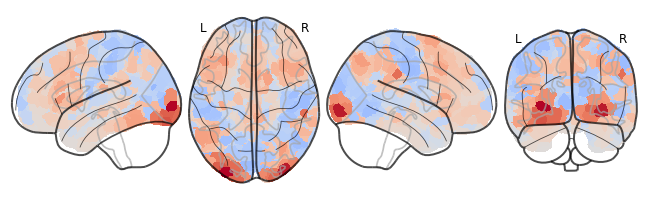

**********

sub-03, split-693, b2, Word Reading (Predicted)


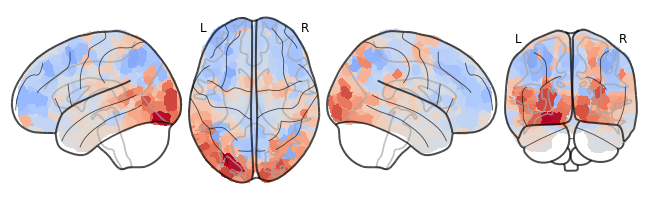

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-03, split-363, b1, Word Reading
Pearson's r = 0.734

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b1/sub-03/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-03_WordRead_zmap.npy

sub-03, split-363, b1, Word Reading (True)


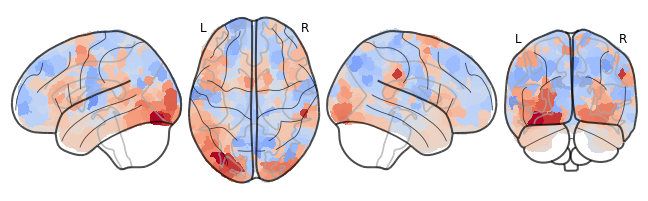

**********

sub-03, split-363, b1, Word Reading (Predicted)


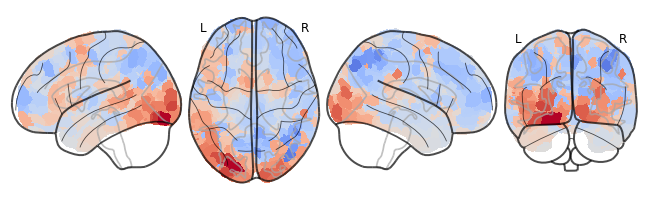

In [15]:
# Example
sub = 'sub-03'
filter_taskName = ['Word Reading']
filter_taskID = None
filter_split = None
sort_by_corr = True
num_examples = 2
vmin_vmax = (None, None)
plot_titles = False

plot_examples(output_dir, sub, atlas_img, X_df, task2task_inv,
              sort_by_corr=sort_by_corr, num_examples=num_examples, vmin_vmax=vmin_vmax,
              filter_taskName=filter_taskName, filter_taskID=filter_taskID, filter_split=filter_split,
              plot_titles=plot_titles)

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-02, split-148, b1, Permuted Rules (CPRO)
Pearson's r = 0.620

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b1/sub-02/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-02_PermutedRules_zmap.npy

sub-02, split-148, b1, Permuted Rules (CPRO) (True)


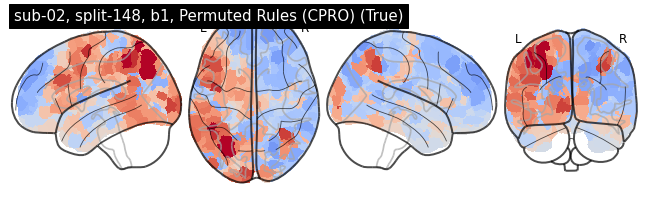

**********

sub-02, split-148, b1, Permuted Rules (CPRO) (Predicted)


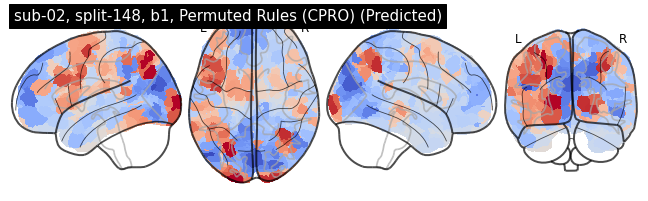

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-02, split-807, b2, Permuted Rules (CPRO)
Pearson's r = 0.691

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b2/sub-02/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-02_PermutedRules_zmap.npy

sub-02, split-807, b2, Permuted Rules (CPRO) (True)


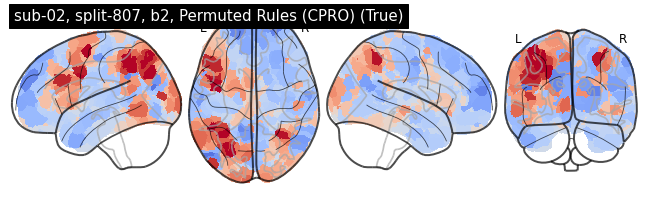

**********

sub-02, split-807, b2, Permuted Rules (CPRO) (Predicted)


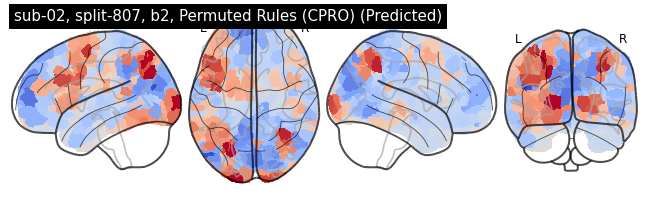

In [5]:
# Example: Subject 2, CPRO, worst and best predictions
sub = 'sub-02'
filter_taskName = ['Permuted Rules (CPRO)']
filter_taskID = None
filter_split = None
sort_by_corr = True
num_examples = 2
vmin_vmax = (-3, 3)
plot_titles = True

plot_examples(output_dir, sub, atlas_img, X_df, task2task_inv,
              sort_by_corr=sort_by_corr, num_examples=num_examples, vmin_vmax=vmin_vmax,
              filter_taskName=filter_taskName, filter_taskID=filter_taskID, filter_split=filter_split,
              plot_titles=plot_titles)

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-03, split-485, a2, Motor Imagery
Pearson's r = 0.091

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a2/sub-03/niis/sub-03_MotorImagery_zmap.nii.gz

sub-03, split-485, a2, Motor Imagery (Ground truth)


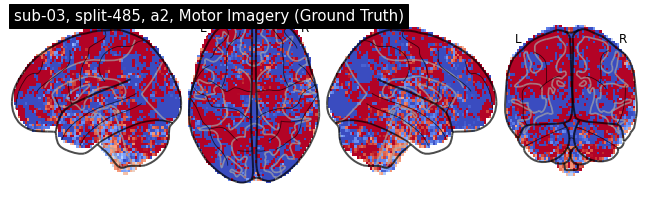

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a2/sub-03/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-03_MotorImagery_zmap.npy

sub-03, split-485, a2, Motor Imagery (True)


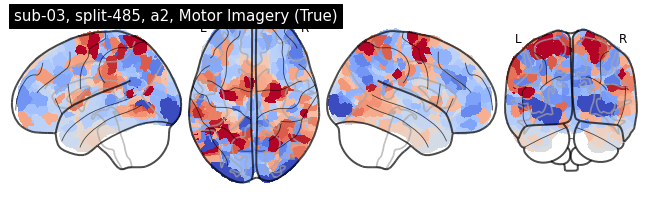

**********

sub-03, split-485, a2, Motor Imagery (Predicted)


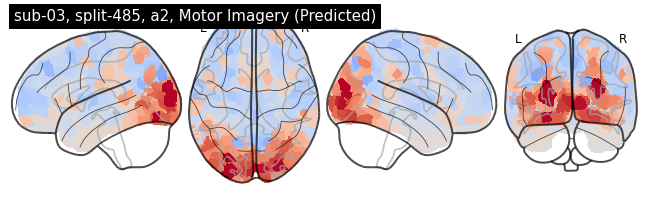

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-03, split-686, b1, Mental Rotation (Med)
Pearson's r = 0.955

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b1/sub-03/niis/sub-03_MentalRotMed_zmap.nii.gz

sub-03, split-686, b1, Mental Rotation (Med) (Ground truth)


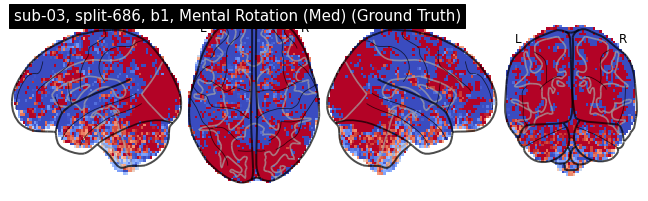

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b1/sub-03/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-03_MentalRotMed_zmap.npy

sub-03, split-686, b1, Mental Rotation (Med) (True)


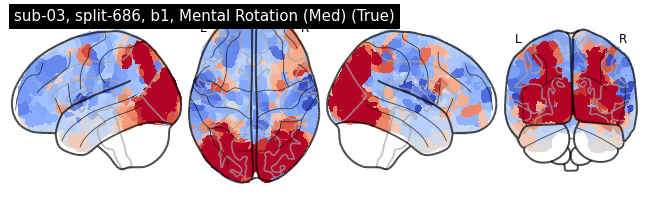

**********

sub-03, split-686, b1, Mental Rotation (Med) (Predicted)


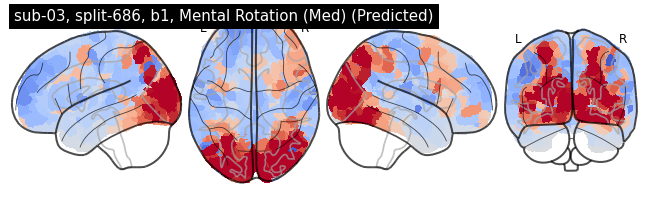

In [6]:
# Example: Subject 3, CPRO, worst and best predictions
sub = 'sub-03'
filter_taskName = None
filter_taskID = None
filter_split = None
sort_by_corr = True
num_examples = 2
vmin_vmax = (-3, 3)
plot_titles = True

plot_examples(output_dir, sub, atlas_img, X_df, task2task_inv,
              sort_by_corr=sort_by_corr, num_examples=num_examples, vmin_vmax=vmin_vmax,
              filter_taskName=filter_taskName, filter_taskID=filter_taskID, filter_split=filter_split,
              plot_titles=plot_titles)

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-02, split-485, b1, Spatial Imagery
Pearson's r = -0.273

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b1/sub-02/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-02_SpatialImagery_zmap.npy

sub-02, split-485, b1, Spatial Imagery (True)


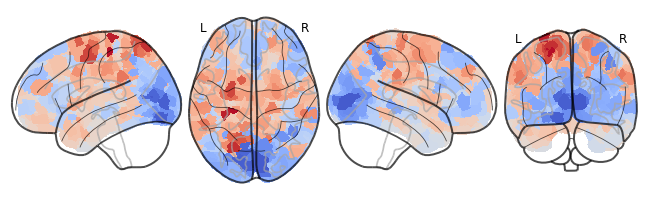

**********

sub-02, split-485, b1, Spatial Imagery (Predicted)


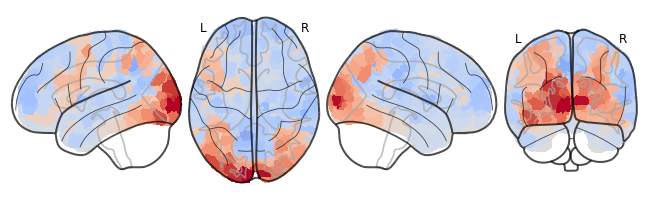

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-02, split-90, a1, Digit Judgment
Pearson's r = 0.301

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a1/sub-02/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-02_DigitJudgement_zmap.npy

sub-02, split-90, a1, Digit Judgment (True)


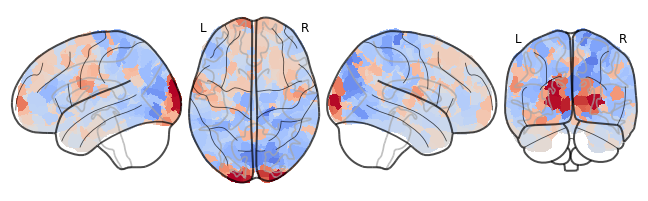

**********

sub-02, split-90, a1, Digit Judgment (Predicted)


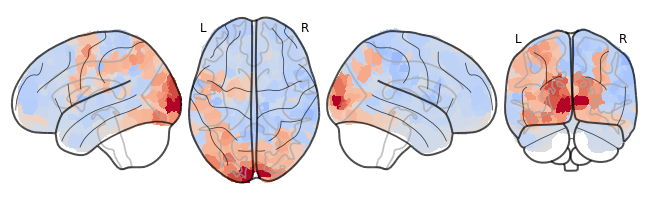

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-02, split-13, b2, Finger Simple
Pearson's r = 0.417

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b2/sub-02/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-02_FingerSimple_zmap.npy

sub-02, split-13, b2, Finger Simple (True)


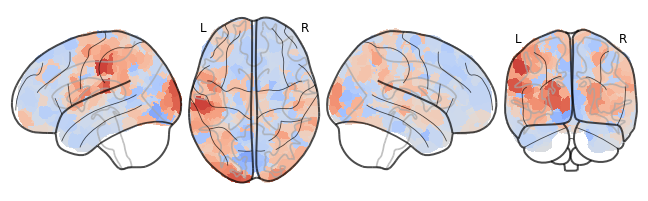

**********

sub-02, split-13, b2, Finger Simple (Predicted)


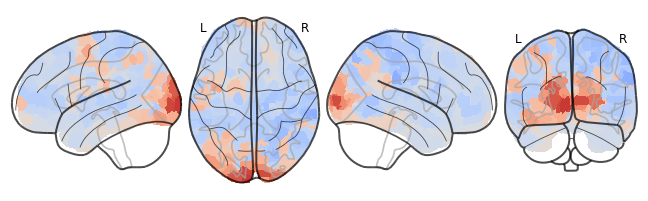

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-02, split-486, a2, Stroop (Incongruent)
Pearson's r = 0.504

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a2/sub-02/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-02_StroopIncon_zmap.npy

sub-02, split-486, a2, Stroop (Incongruent) (True)


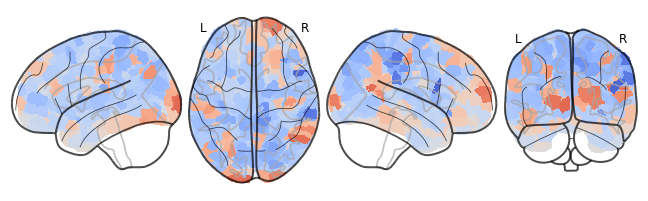

**********

sub-02, split-486, a2, Stroop (Incongruent) (Predicted)


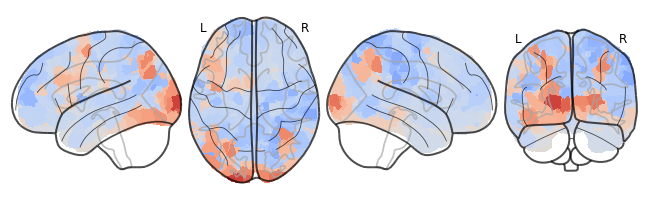

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-02, split-649, b2, Visual Search (Easy)
Pearson's r = 0.536

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b2/sub-02/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-02_VisualSearchEasy_zmap.npy

sub-02, split-649, b2, Visual Search (Easy) (True)


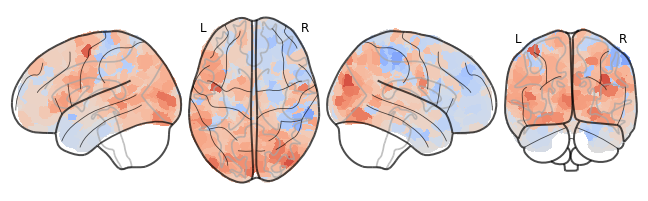

**********

sub-02, split-649, b2, Visual Search (Easy) (Predicted)


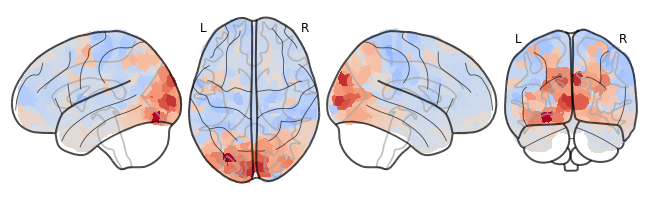

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-02, split-116, b2, Theory of Mind
Pearson's r = 0.576

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b2/sub-02/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-02_TheoryOfMind_zmap.npy

sub-02, split-116, b2, Theory of Mind (True)


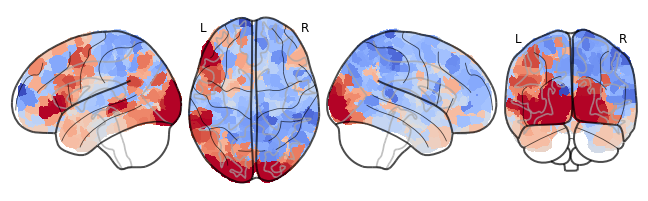

**********

sub-02, split-116, b2, Theory of Mind (Predicted)


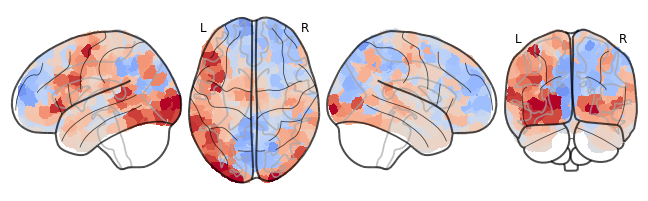

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-02, split-14, b1, Finger Sequence
Pearson's r = 0.606

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b1/sub-02/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-02_FingerSeq_zmap.npy

sub-02, split-14, b1, Finger Sequence (True)


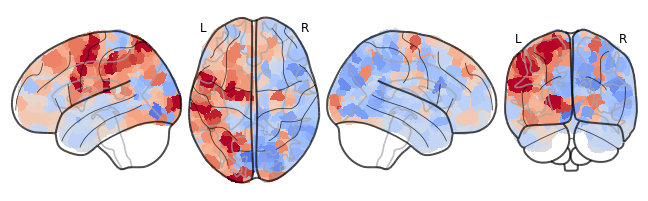

**********

sub-02, split-14, b1, Finger Sequence (Predicted)


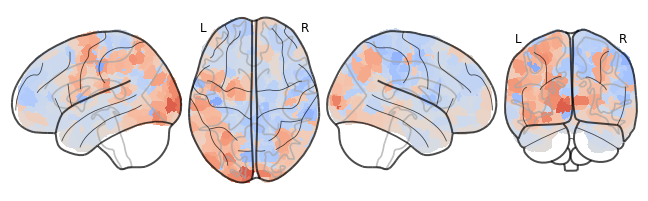

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-02, split-499, a2, Motor Imagery
Pearson's r = 0.630

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a2/sub-02/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-02_MotorImagery_zmap.npy

sub-02, split-499, a2, Motor Imagery (True)


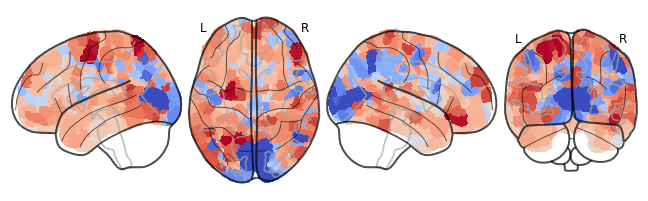

**********

sub-02, split-499, a2, Motor Imagery (Predicted)


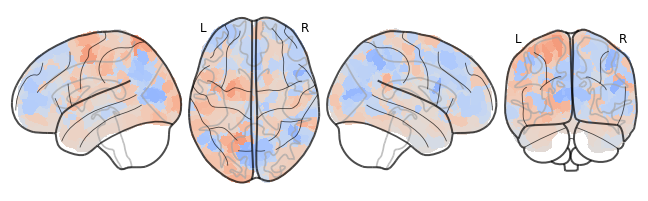

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-02, split-812, b1, Prediction (True)
Pearson's r = 0.663

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b1/sub-02/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-02_Prediction_zmap.npy

sub-02, split-812, b1, Prediction (True) (True)


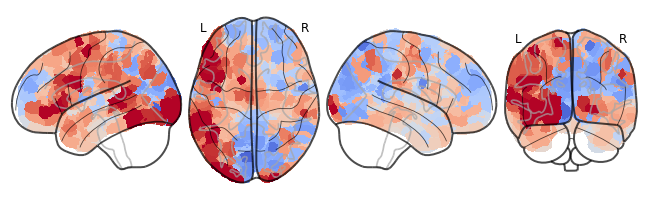

**********

sub-02, split-812, b1, Prediction (True) (Predicted)


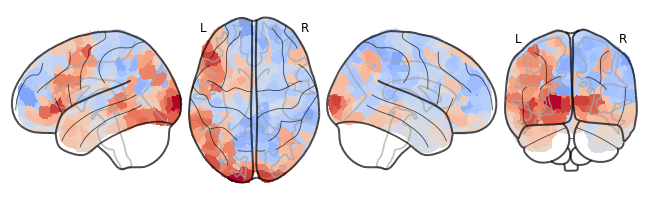

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-02, split-154, b1, Video (Actions)
Pearson's r = 0.686

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b1/sub-02/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-02_VideoActions_zmap.npy

sub-02, split-154, b1, Video (Actions) (True)


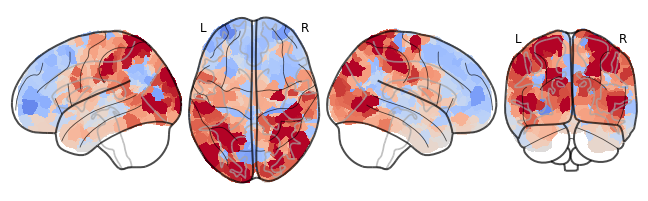

**********

sub-02, split-154, b1, Video (Actions) (Predicted)


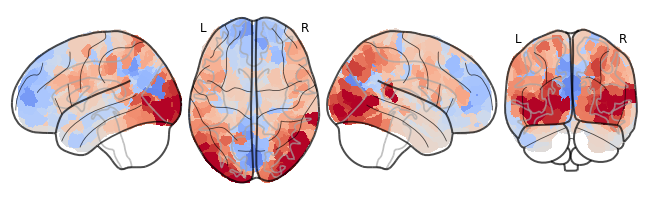

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-02, split-48, a1, Math
Pearson's r = 0.709

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a1/sub-02/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-02_Math_zmap.npy

sub-02, split-48, a1, Math (True)


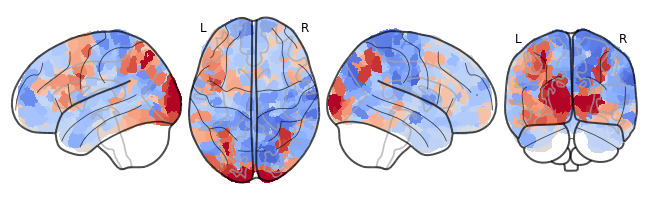

**********

sub-02, split-48, a1, Math (Predicted)


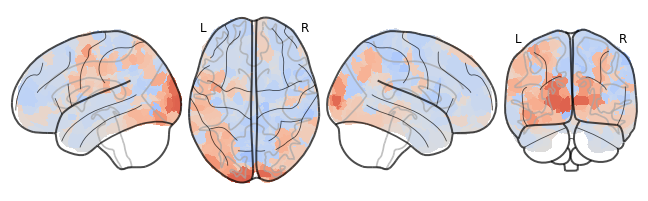

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-02, split-856, b2, Spatial Map (Easy)
Pearson's r = 0.734

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b2/sub-02/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-02_SpatialMapEasy_zmap.npy

sub-02, split-856, b2, Spatial Map (Easy) (True)


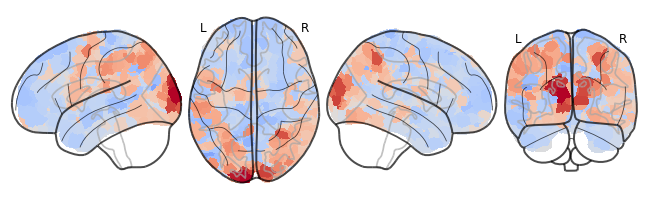

**********

sub-02, split-856, b2, Spatial Map (Easy) (Predicted)


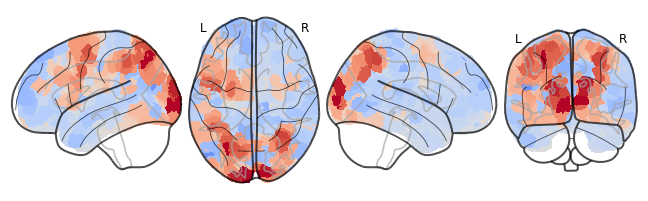

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-02, split-256, a1, Stroop (Congruent)
Pearson's r = 0.749

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a1/sub-02/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-02_StroopCon_zmap.npy

sub-02, split-256, a1, Stroop (Congruent) (True)


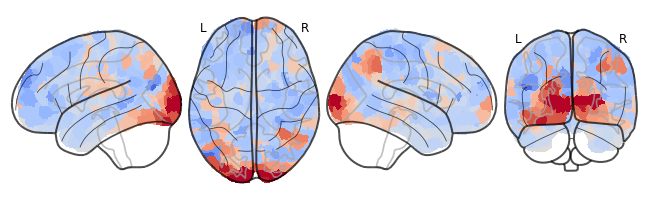

**********

sub-02, split-256, a1, Stroop (Congruent) (Predicted)


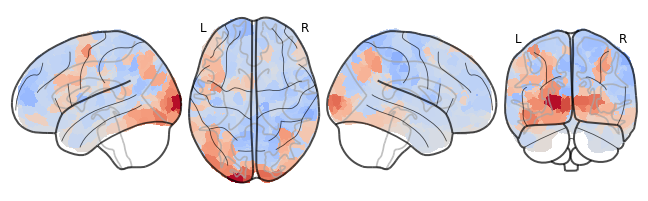

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-02, split-434, a1, Happy Faces
Pearson's r = 0.764

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a1/sub-02/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-02_HappyFaces_zmap.npy

sub-02, split-434, a1, Happy Faces (True)


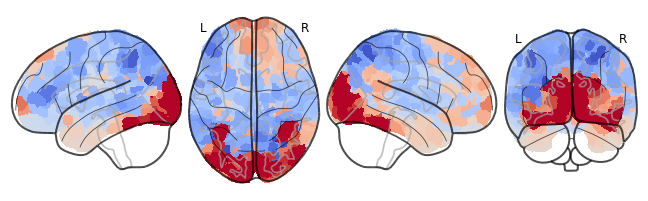

**********

sub-02, split-434, a1, Happy Faces (Predicted)


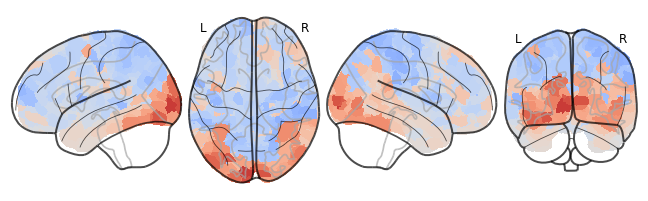

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-02, split-153, b2, Video (Actions)
Pearson's r = 0.781

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b2/sub-02/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-02_VideoActions_zmap.npy

sub-02, split-153, b2, Video (Actions) (True)


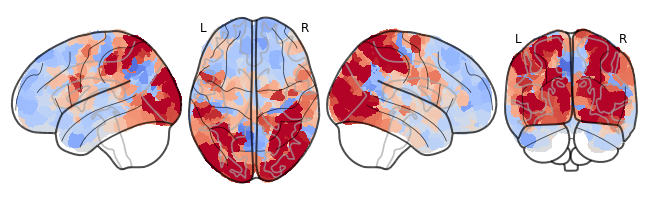

**********

sub-02, split-153, b2, Video (Actions) (Predicted)


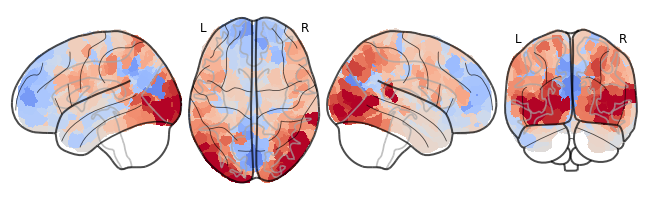

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-02, split-781, a2, Visual Search (Hard)
Pearson's r = 0.800

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a2/sub-02/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-02_VisualSearchHard_zmap.npy

sub-02, split-781, a2, Visual Search (Hard) (True)


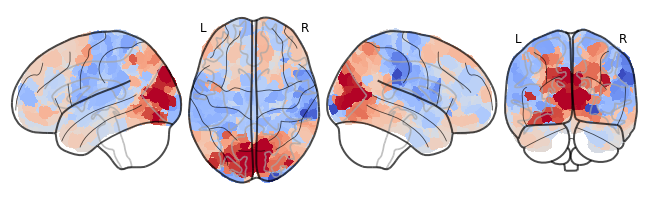

**********

sub-02, split-781, a2, Visual Search (Hard) (Predicted)


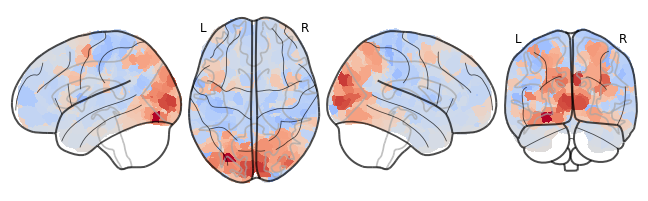

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-02, split-166, a2, Unpleasant Scenes
Pearson's r = 0.829

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a2/sub-02/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-02_UnpleasantScenes_zmap.npy

sub-02, split-166, a2, Unpleasant Scenes (True)


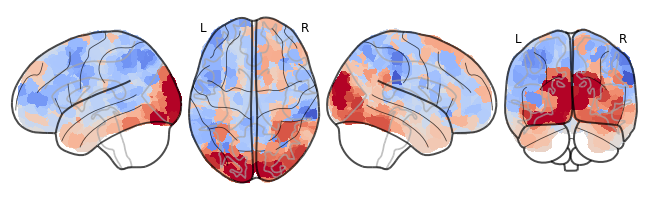

**********

sub-02, split-166, a2, Unpleasant Scenes (Predicted)


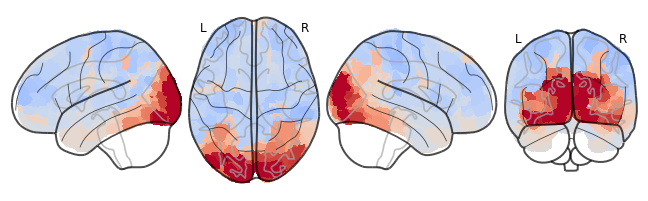

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-02, split-803, b2, Mental Rotation (Med)
Pearson's r = 0.868

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b2/sub-02/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-02_MentalRotMed_zmap.npy

sub-02, split-803, b2, Mental Rotation (Med) (True)


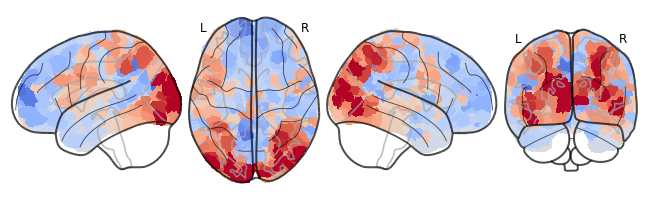

**********

sub-02, split-803, b2, Mental Rotation (Med) (Predicted)


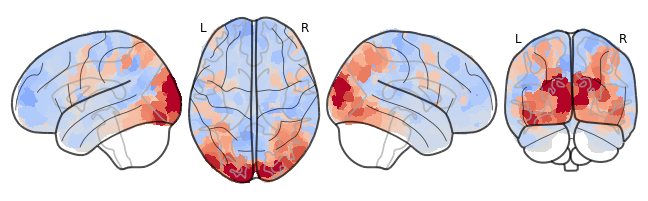

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-02, split-771, a1, Visual Search (Med)
Pearson's r = 0.884

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a1/sub-02/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-02_VisualSearchMed_zmap.npy

sub-02, split-771, a1, Visual Search (Med) (True)


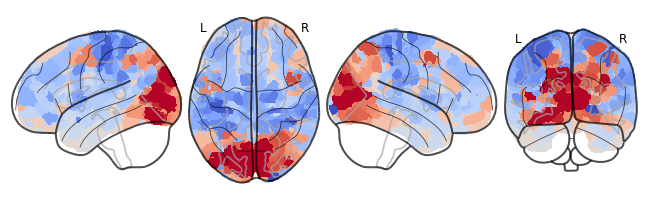

**********

sub-02, split-771, a1, Visual Search (Med) (Predicted)


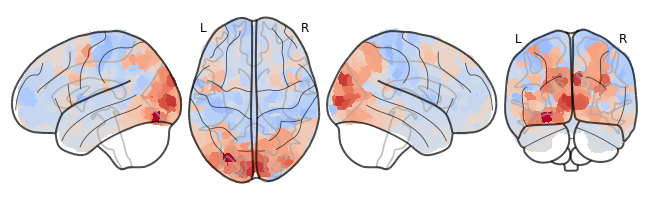

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-02, split-115, b1, Movie (Nature)
Pearson's r = 0.926

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b1/sub-02/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-02_NatureMovie_zmap.npy

sub-02, split-115, b1, Movie (Nature) (True)


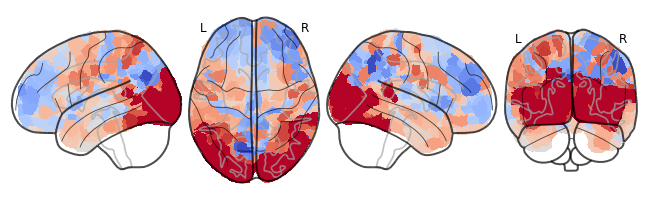

**********

sub-02, split-115, b1, Movie (Nature) (Predicted)


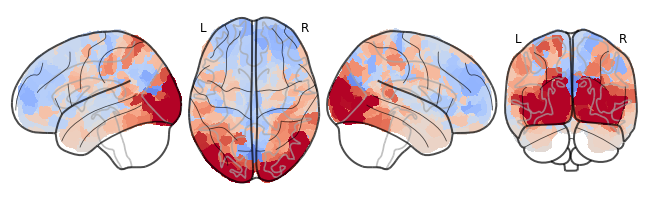

In [6]:
# Example: Subject 2, 20 predictions evenly distributed from lowest to highest correlations
sub = 'sub-02'
filter_taskName = None
filter_taskID = None
filter_split = None
sort_by_corr = True
num_examples = 20
vmin_vmax = (-3, 3)
plot_titles = False
plot_original = False

plot_examples(output_dir, sub, atlas_img, X_df, task2task_inv,
              sort_by_corr=sort_by_corr, num_examples=num_examples, vmin_vmax=vmin_vmax,
              filter_taskName=filter_taskName, filter_taskID=filter_taskID, filter_split=filter_split,
              plot_titles=plot_titles, plot_original=plot_original)

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-03, split-485, a2, Motor Imagery
Pearson's r = 0.091

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a2/sub-03/niis/sub-03_MotorImagery_zmap.nii.gz

sub-03, split-485, a2, Motor Imagery (Ground truth)


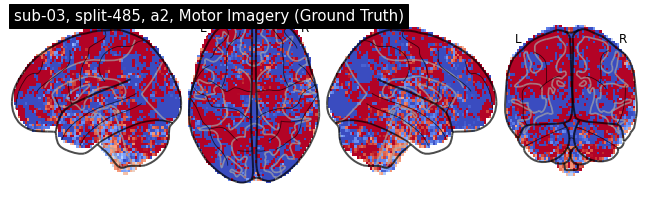

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a2/sub-03/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-03_MotorImagery_zmap.npy

sub-03, split-485, a2, Motor Imagery (True)


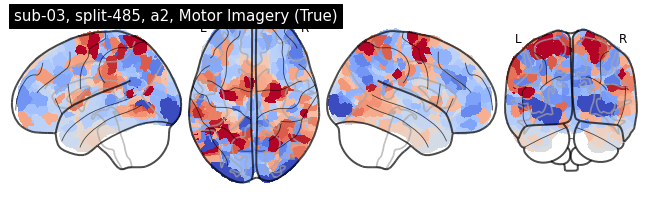

**********

sub-03, split-485, a2, Motor Imagery (Predicted)


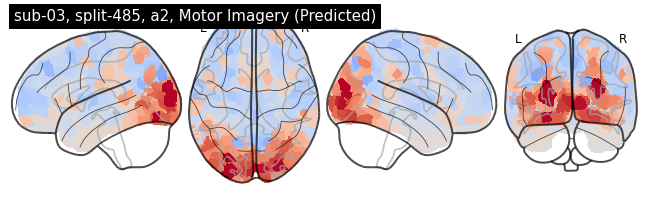

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-03, split-633, a1, Spatial Imagery
Pearson's r = 0.419

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a1/sub-03/niis/sub-03_SpatialImagery_zmap.nii.gz

sub-03, split-633, a1, Spatial Imagery (Ground truth)


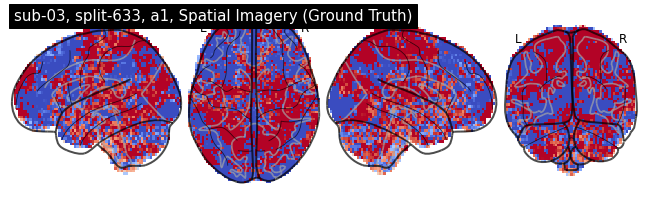

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a1/sub-03/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-03_SpatialImagery_zmap.npy

sub-03, split-633, a1, Spatial Imagery (True)


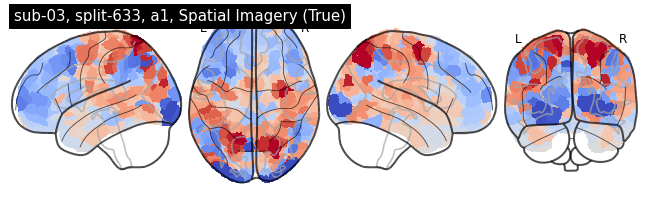

**********

sub-03, split-633, a1, Spatial Imagery (Predicted)


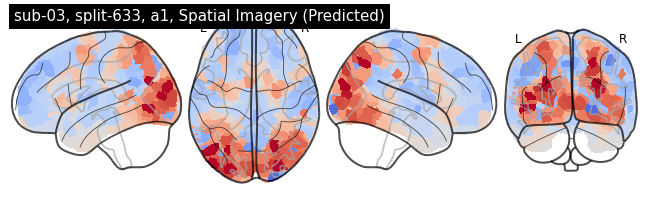

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-03, split-125, a1, Theory of Mind
Pearson's r = 0.506

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a1/sub-03/niis/sub-03_TheoryOfMind_zmap.nii.gz

sub-03, split-125, a1, Theory of Mind (Ground truth)


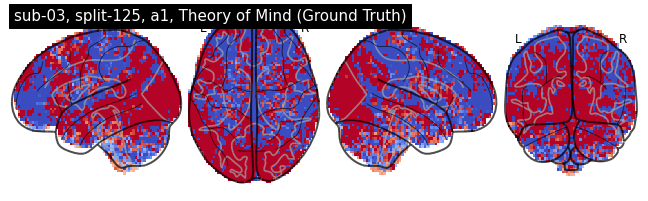

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a1/sub-03/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-03_TheoryOfMind_zmap.npy

sub-03, split-125, a1, Theory of Mind (True)


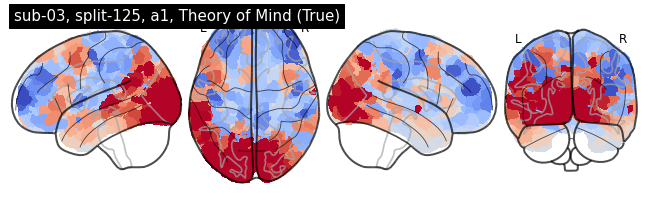

**********

sub-03, split-125, a1, Theory of Mind (Predicted)


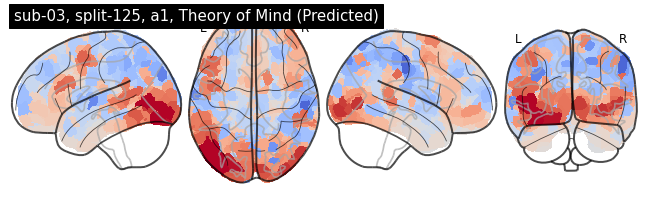

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-03, split-591, a2, Verbal 2-back
Pearson's r = 0.564

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a2/sub-03/niis/sub-03_Verbal2Back_zmap.nii.gz

sub-03, split-591, a2, Verbal 2-back (Ground truth)


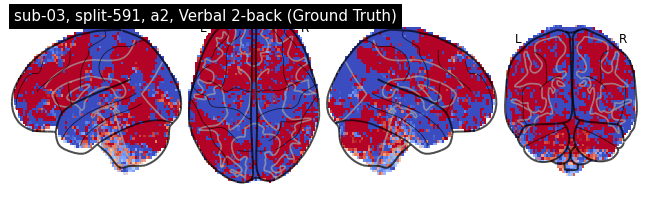

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a2/sub-03/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-03_Verbal2Back_zmap.npy

sub-03, split-591, a2, Verbal 2-back (True)


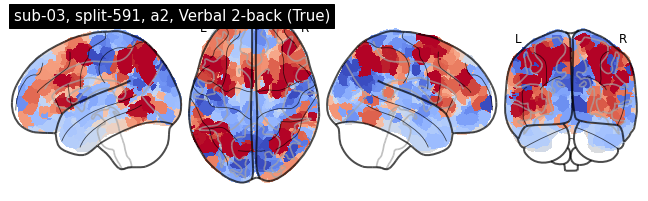

**********

sub-03, split-591, a2, Verbal 2-back (Predicted)


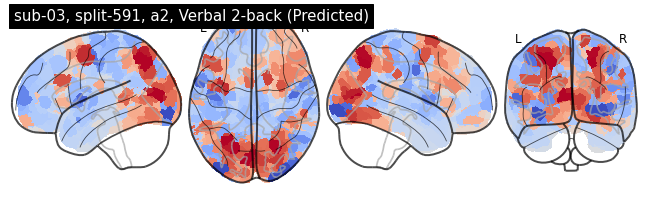

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-03, split-290, a2, Math
Pearson's r = 0.591

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a2/sub-03/niis/sub-03_Math_zmap.nii.gz

sub-03, split-290, a2, Math (Ground truth)


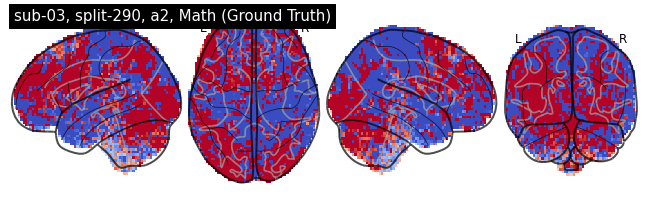

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a2/sub-03/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-03_Math_zmap.npy

sub-03, split-290, a2, Math (True)


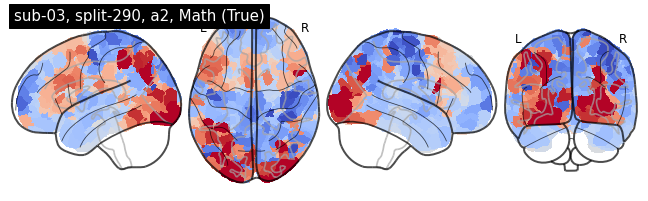

**********

sub-03, split-290, a2, Math (Predicted)


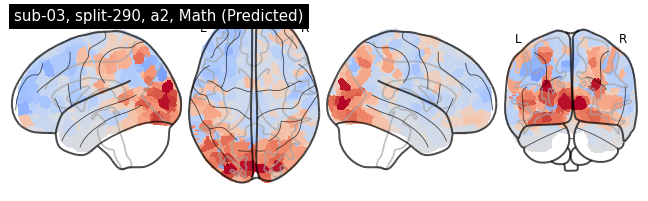

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-03, split-458, a1, Verb Generation
Pearson's r = 0.641

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a1/sub-03/niis/sub-03_VerbGen_zmap.nii.gz

sub-03, split-458, a1, Verb Generation (Ground truth)


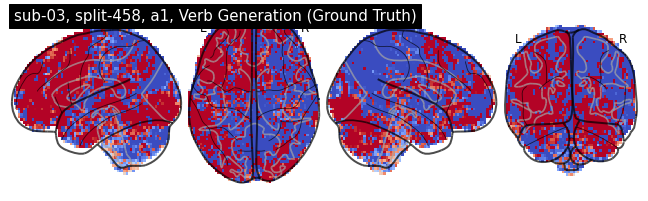

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a1/sub-03/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-03_VerbGen_zmap.npy

sub-03, split-458, a1, Verb Generation (True)


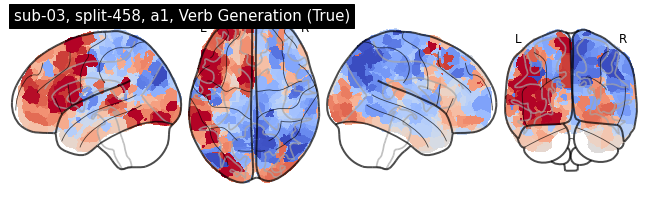

**********

sub-03, split-458, a1, Verb Generation (Predicted)


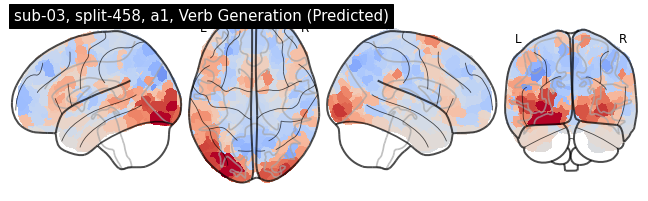

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-03, split-751, b1, Visual Search (Easy)
Pearson's r = 0.668

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b1/sub-03/niis/sub-03_VisualSearchEasy_zmap.nii.gz

sub-03, split-751, b1, Visual Search (Easy) (Ground truth)


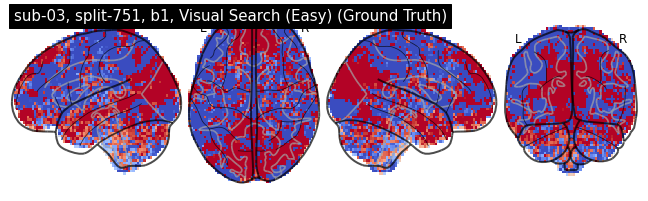

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b1/sub-03/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-03_VisualSearchEasy_zmap.npy

sub-03, split-751, b1, Visual Search (Easy) (True)


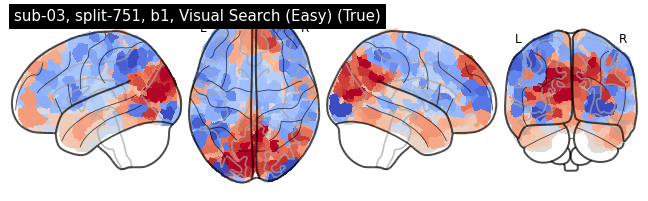

**********

sub-03, split-751, b1, Visual Search (Easy) (Predicted)


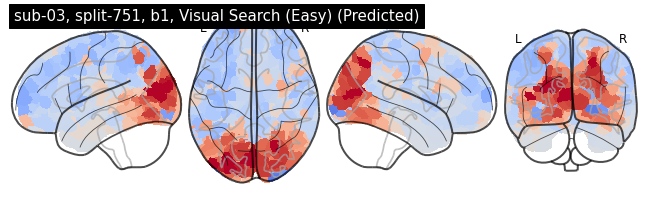

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-03, split-803, b2, Permuted Rules (CPRO)
Pearson's r = 0.694

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b2/sub-03/niis/sub-03_PermutedRules_zmap.nii.gz

sub-03, split-803, b2, Permuted Rules (CPRO) (Ground truth)


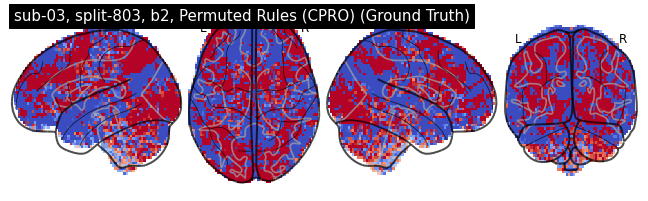

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b2/sub-03/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-03_PermutedRules_zmap.npy

sub-03, split-803, b2, Permuted Rules (CPRO) (True)


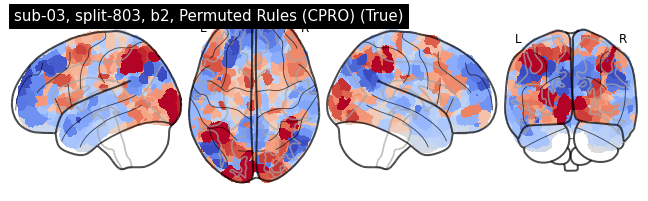

**********

sub-03, split-803, b2, Permuted Rules (CPRO) (Predicted)


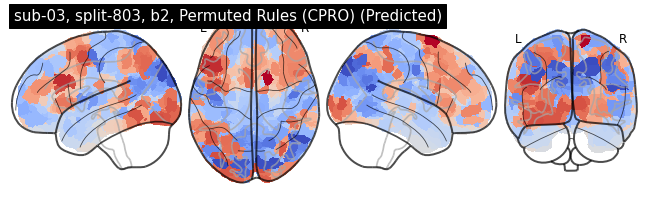

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-03, split-148, b1, Video (Actions)
Pearson's r = 0.712

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b1/sub-03/niis/sub-03_VideoActions_zmap.nii.gz

sub-03, split-148, b1, Video (Actions) (Ground truth)


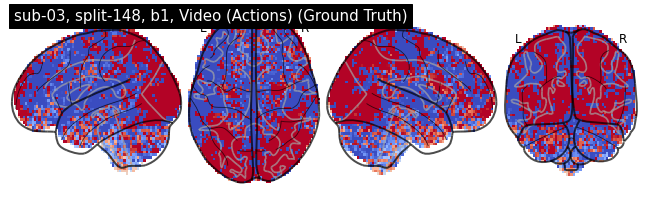

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b1/sub-03/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-03_VideoActions_zmap.npy

sub-03, split-148, b1, Video (Actions) (True)


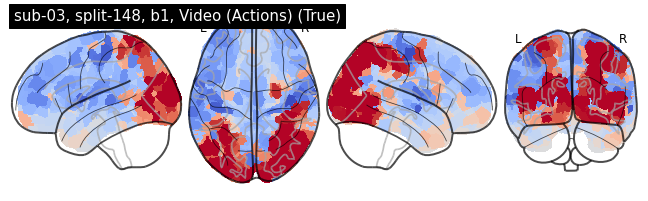

**********

sub-03, split-148, b1, Video (Actions) (Predicted)


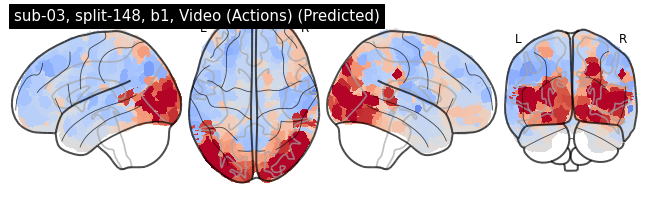

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-03, split-334, b1, Prediction (True)
Pearson's r = 0.744

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b1/sub-03/niis/sub-03_Prediction_zmap.nii.gz

sub-03, split-334, b1, Prediction (True) (Ground truth)


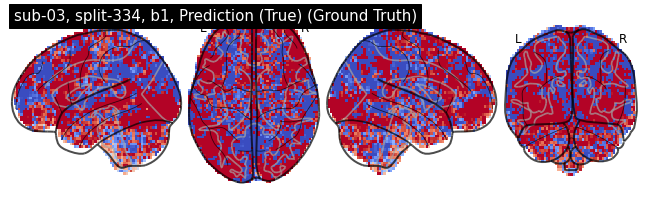

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b1/sub-03/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-03_Prediction_zmap.npy

sub-03, split-334, b1, Prediction (True) (True)


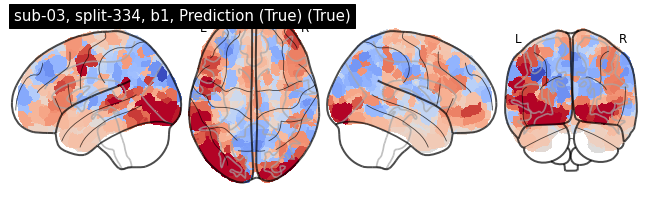

**********

sub-03, split-334, b1, Prediction (True) (Predicted)


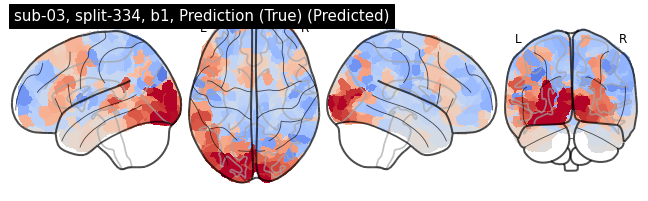

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-03, split-695, b1, Visual Search (Med)
Pearson's r = 0.764

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b1/sub-03/niis/sub-03_VisualSearchMed_zmap.nii.gz

sub-03, split-695, b1, Visual Search (Med) (Ground truth)


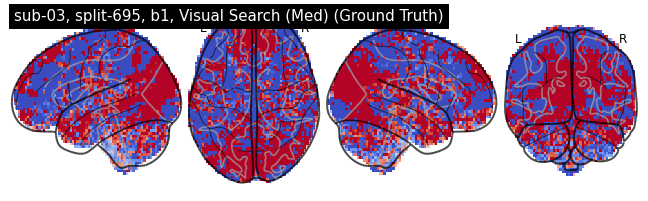

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b1/sub-03/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-03_VisualSearchMed_zmap.npy

sub-03, split-695, b1, Visual Search (Med) (True)


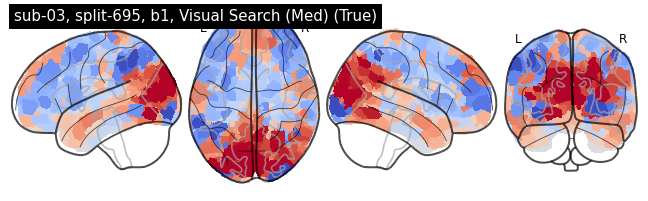

**********

sub-03, split-695, b1, Visual Search (Med) (Predicted)


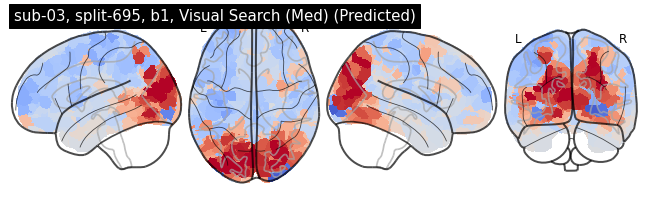

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-03, split-183, b1, Video (Knots)
Pearson's r = 0.786

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b1/sub-03/niis/sub-03_VideoKnots_zmap.nii.gz

sub-03, split-183, b1, Video (Knots) (Ground truth)


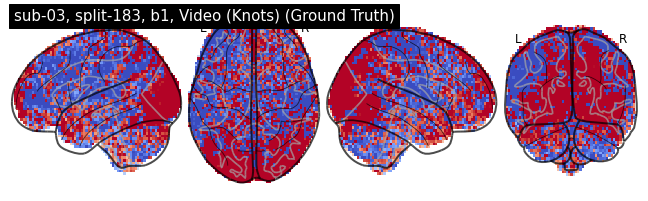

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b1/sub-03/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-03_VideoKnots_zmap.npy

sub-03, split-183, b1, Video (Knots) (True)


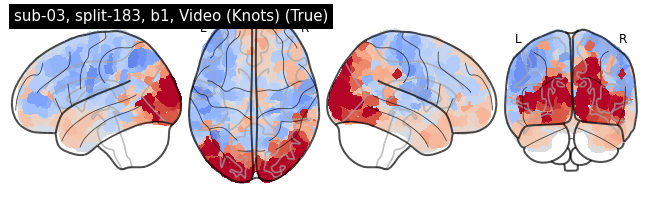

**********

sub-03, split-183, b1, Video (Knots) (Predicted)


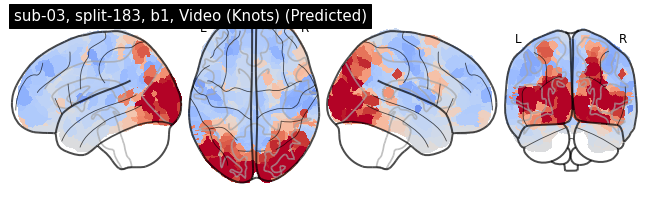

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-03, split-352, a2, Happy Faces
Pearson's r = 0.796

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a2/sub-03/niis/sub-03_HappyFaces_zmap.nii.gz

sub-03, split-352, a2, Happy Faces (Ground truth)


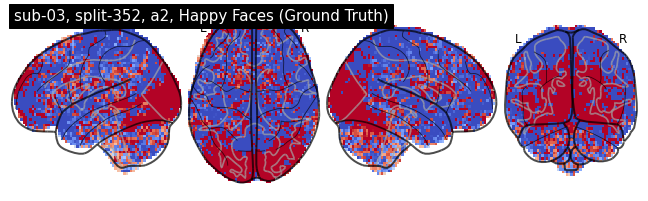

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a2/sub-03/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-03_HappyFaces_zmap.npy

sub-03, split-352, a2, Happy Faces (True)


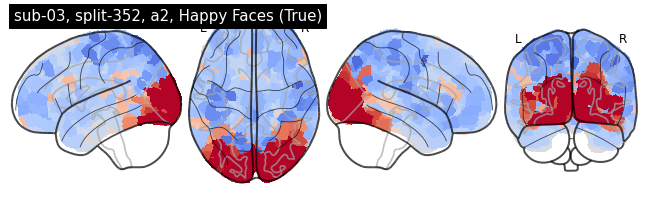

**********

sub-03, split-352, a2, Happy Faces (Predicted)


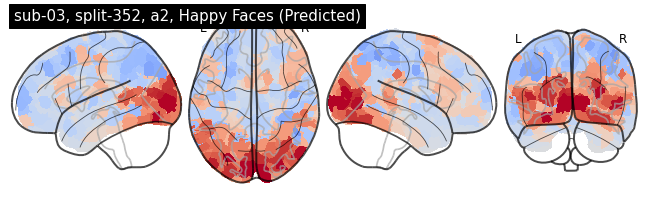

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-03, split-720, b1, Prediction (Violated)
Pearson's r = 0.819

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b1/sub-03/niis/sub-03_PredictViol_zmap.nii.gz

sub-03, split-720, b1, Prediction (Violated) (Ground truth)


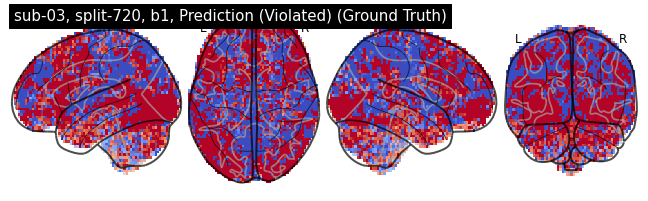

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b1/sub-03/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-03_PredictViol_zmap.npy

sub-03, split-720, b1, Prediction (Violated) (True)


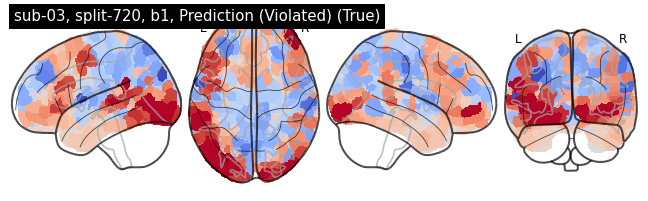

**********

sub-03, split-720, b1, Prediction (Violated) (Predicted)


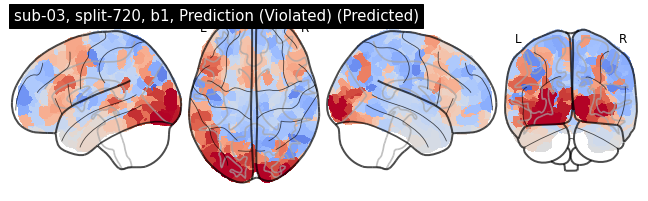

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-03, split-236, a2, Unpleasant Scenes
Pearson's r = 0.840

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a2/sub-03/niis/sub-03_UnpleasantScenes_zmap.nii.gz

sub-03, split-236, a2, Unpleasant Scenes (Ground truth)


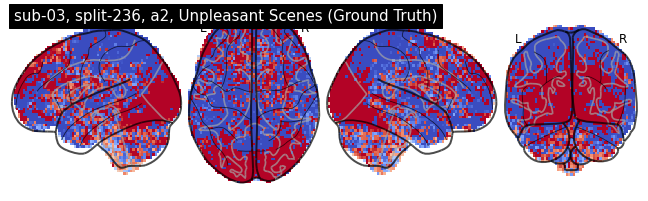

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a2/sub-03/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-03_UnpleasantScenes_zmap.npy

sub-03, split-236, a2, Unpleasant Scenes (True)


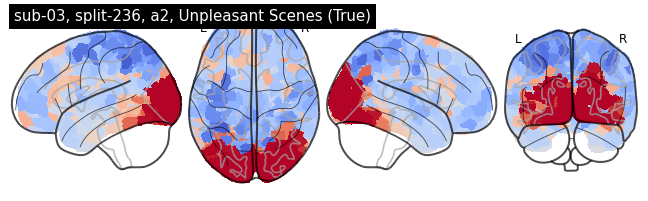

**********

sub-03, split-236, a2, Unpleasant Scenes (Predicted)


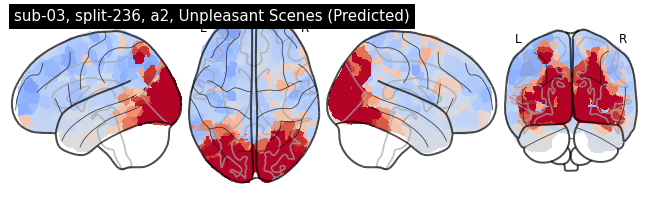

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-03, split-896, b2, Movie (Nature)
Pearson's r = 0.864

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b2/sub-03/niis/sub-03_NatureMovie_zmap.nii.gz

sub-03, split-896, b2, Movie (Nature) (Ground truth)


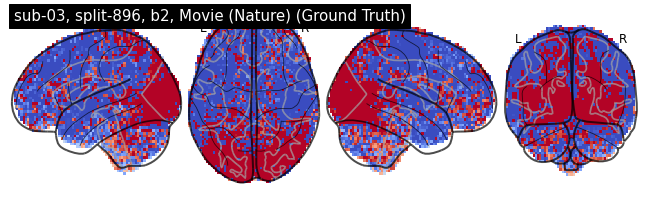

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b2/sub-03/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-03_NatureMovie_zmap.npy

sub-03, split-896, b2, Movie (Nature) (True)


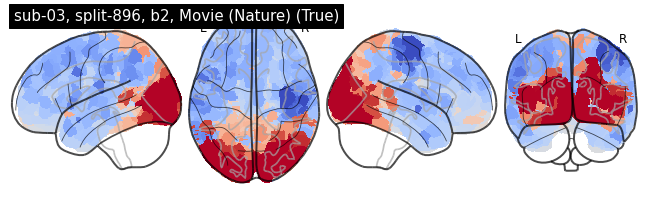

**********

sub-03, split-896, b2, Movie (Nature) (Predicted)


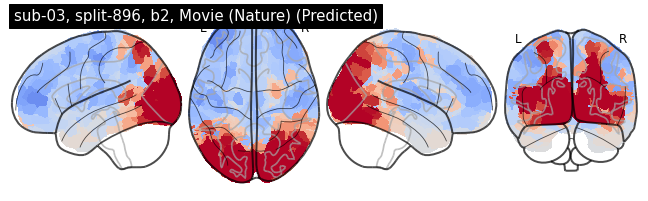

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-03, split-782, b2, Movie (Nature)
Pearson's r = 0.878

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b2/sub-03/niis/sub-03_NatureMovie_zmap.nii.gz

sub-03, split-782, b2, Movie (Nature) (Ground truth)


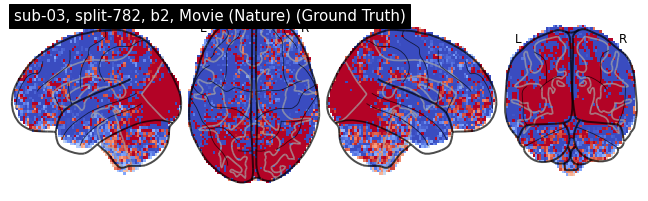

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b2/sub-03/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-03_NatureMovie_zmap.npy

sub-03, split-782, b2, Movie (Nature) (True)


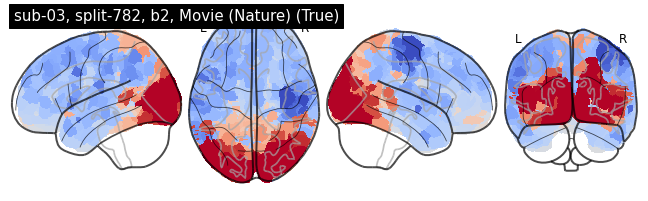

**********

sub-03, split-782, b2, Movie (Nature) (Predicted)


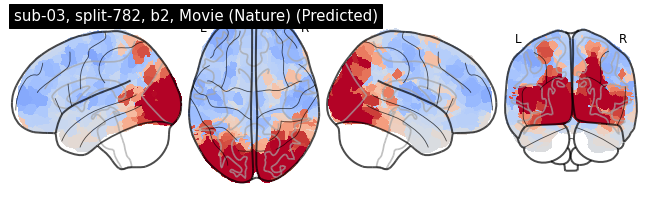

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-03, split-353, a2, Object Viewing
Pearson's r = 0.895

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a2/sub-03/niis/sub-03_Objects_zmap.nii.gz

sub-03, split-353, a2, Object Viewing (Ground truth)


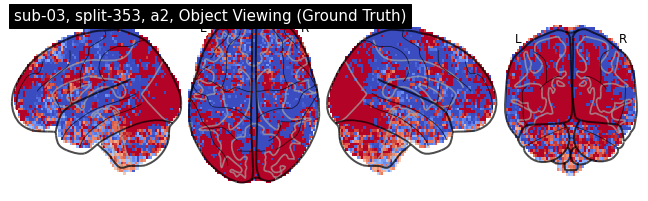

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a2/sub-03/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-03_Objects_zmap.npy

sub-03, split-353, a2, Object Viewing (True)


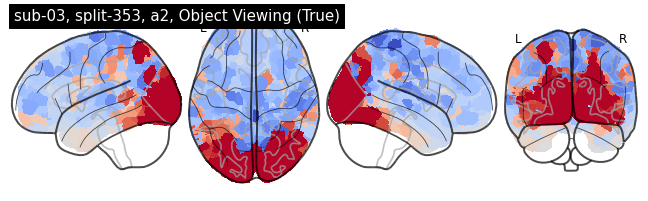

**********

sub-03, split-353, a2, Object Viewing (Predicted)


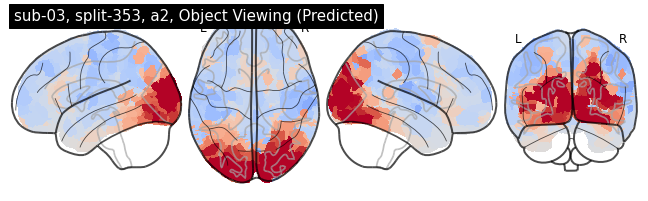

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-03, split-259, a1, Visual Search (Easy)
Pearson's r = 0.923

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a1/sub-03/niis/sub-03_VisualSearchEasy_zmap.nii.gz

sub-03, split-259, a1, Visual Search (Easy) (Ground truth)


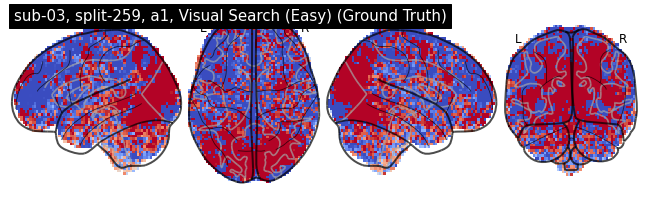

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/a1/sub-03/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-03_VisualSearchEasy_zmap.npy

sub-03, split-259, a1, Visual Search (Easy) (True)


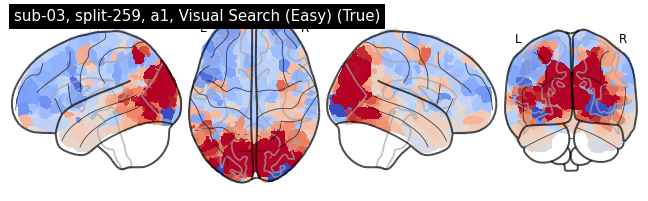

**********

sub-03, split-259, a1, Visual Search (Easy) (Predicted)


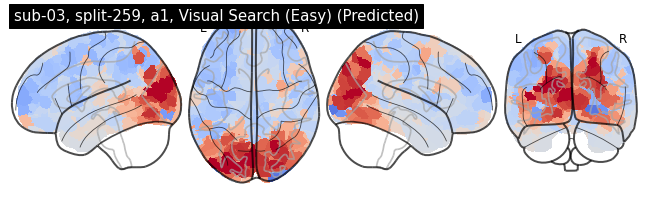

****************************************************************************************************
****************************************************************************************************
****************************************************************************************************

sub-03, split-686, b1, Mental Rotation (Med)
Pearson's r = 0.955

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b1/sub-03/niis/sub-03_MentalRotMed_zmap.nii.gz

sub-03, split-686, b1, Mental Rotation (Med) (Ground truth)


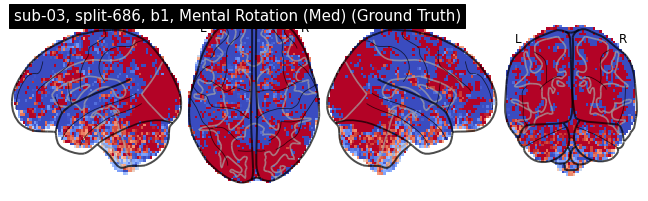

**********

/Users/walters/Documents/GitHub/cognitive-encoding-models_multitask/Y_data/first_level_bySession/b1/sub-03/parcellated/schaefer_2018/MNI152NLin2009cAsym/sub-03_MentalRotMed_zmap.npy

sub-03, split-686, b1, Mental Rotation (Med) (True)


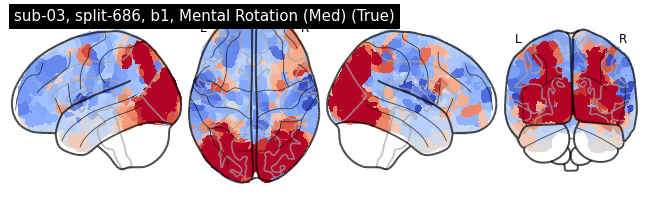

**********

sub-03, split-686, b1, Mental Rotation (Med) (Predicted)


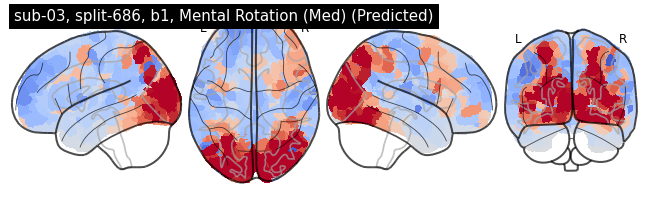

In [16]:
# Example: Subject 3, 20 predictions evenly distributed from lowest to highest correlations
sub = 'sub-03'
filter_taskName = None
filter_taskID = None
filter_split = None
sort_by_corr = True
num_examples = 20
vmin_vmax = (-3, 3)
plot_titles = True

plot_examples(output_dir, sub, atlas_img, X_df, task2task_inv,
              sort_by_corr=sort_by_corr, num_examples=num_examples, vmin_vmax=vmin_vmax,
              filter_taskName=filter_taskName, filter_taskID=filter_taskID, filter_split=filter_split,
              plot_titles=plot_titles, plot_original=plot_original)